# Histogram Equalization

## Use

We would like to have more vibrant colors in an image, i.e. make the colors "spread" over a larger range.

first we read the image

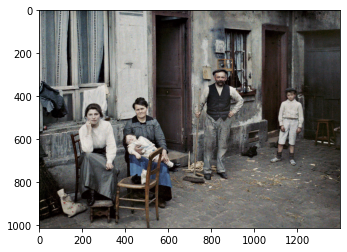

In [9]:
import numpy as np
from imageio import imread
import matplotlib.pyplot as plt
from skimage.color import rgb2gray

NUM_BITS = 8 #bit representation of colors
image_file="old-photo.jpg"

im_mat = imread(image_file).astype(np.float64)
# Normalize
im_mat /= (1<<NUM_BITS)-1
im_mat.max()
plt.imshow(im_mat)

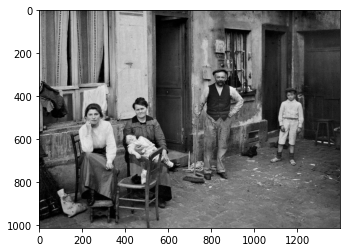

In [10]:
# transform matrix from RGB to YIQ
RGB_YIQ_MAT = np.array([[0.299, 0.587, 0.114],
                        [0.596, -0.275, -0.321],
                        [0.212, -0.523, 0.311]])

def rgb2yiq(imRGB):
    """
    Converting an RGB image to YIQ
    :param imRGB: RGB image matrix
    :return: YIQ image
    """
    yiq_trans = RGB_YIQ_MAT.T  # Transpose of the matrix
    res = np.dot(imRGB, yiq_trans)
    return res

# move to yiq
yiq=rgb2yiq(im_mat)
y_ch = yiq[:,:,0]

# plt.hist(y_ch.flatten(),bins=256)

plt.imshow(y_ch,cmap="gray")

255.0
1.0


(1012, 1400, 3)

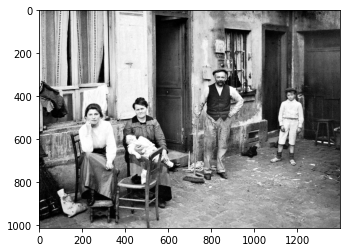

In [11]:

def equalize(im_orig):
    """
    handle equalizing image
    :param im_orig: original image in grayscale representation
    :return: a list containing:
            im_eq - is the equalized image. grayscale or RGB float64 image with values in [0; 1].
            hist_orig - is a 256 bin histogram of the original image (array with shape (256,) ).
            hist_eq - is a 256 bin histogram of the equalized image (array with shape (256,) ).
    """

    bins = 1<<NUM_BITS
    # moving to range [0,255]
    im = np.array(im_orig.copy()) #* (bins - 1)
    hist, bounds = np.histogram(im, bins, (0, 1))
    hist_cumu = np.cumsum(hist)
    # find the first non - zero index
    first_non_zero = np.nonzero(hist_cumu)
    first_val = np.argmin(hist_cumu[first_non_zero])
    stretch_levels = np.round((bins - 1) * (hist_cumu - first_val) / (hist_cumu[- 1] - first_val))
    im_equal = stretch_levels[(im*(bins-1)).astype(np.uint8)]
    hist_equal, bounds_equal = np.histogram(im_equal, bins, (0, bins - 1))
    print(im_equal.max())
    im_equal = (im_equal/(bins-1)).astype(np.float64)  # normalize
    return [im_equal, hist, hist_equal]

im_equal,hist,_ = equalize(y_ch)
print(im_equal.max())
yiq[:,:,0] = im_equal
plt.imshow(y_ch,cmap="gray")
im_equal.max()
# plt.plot(hist)
im_mat.shape

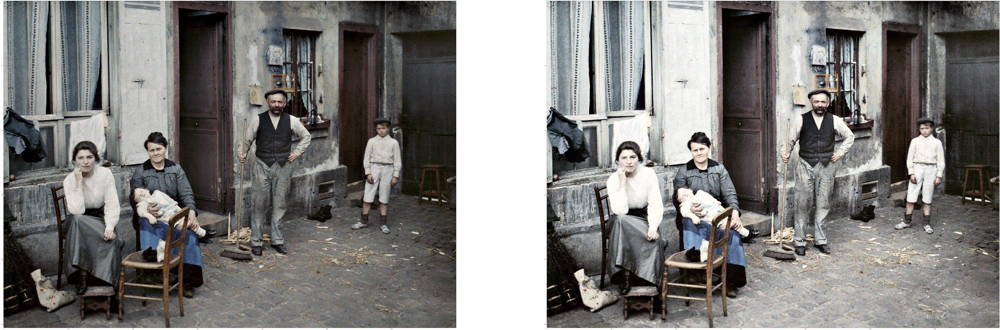

In [12]:
def yiq2rgb(imYIQ):
    """
    Converting an YIQ image to RGB
    :param imYIQ: YIQ image matrix
    :return: RGB image
    """
    yiq_rgb_mat = np.linalg.inv(RGB_YIQ_MAT)  # Invert transform matrix
    res = np.dot(imYIQ, yiq_rgb_mat.T)
    return res

im_equal = yiq2rgb(yiq)
im_equal = np.clip(im_equal,0,1)

im_mat.shape
fig,[ax1,ax2] = plt.subplots(1,2,figsize = (200,200))


ax1.imshow(im_mat)
ax2.imshow(im_equal)

## Summary

#### The Pipeline we used:

1. Compute the normalized cumulative histogram
2. Multiply the normalized histogram by the maximal gray level value (Z-1)
3. Verify that the minimal value is 0 and that the maximal is Z-1, otherwise
    stretch the result linearly in the range [0,Z-1], round the values.
    $T(k) = round{ [C(k)-C(m)] / [C(255)-C(m)] × 255}$, C is the cumulative sum, m is the first non-zero grayscale value
4. Map the intensity values of the image using the results of previous step.